# imports

In [1]:
from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

Using TensorFlow backend.


# settings

In [2]:
sns.set_style('white')
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# datasets

In [3]:
a = SEAM.datasets.load_dataset_raw('P6_neg1_low0_None_auto')

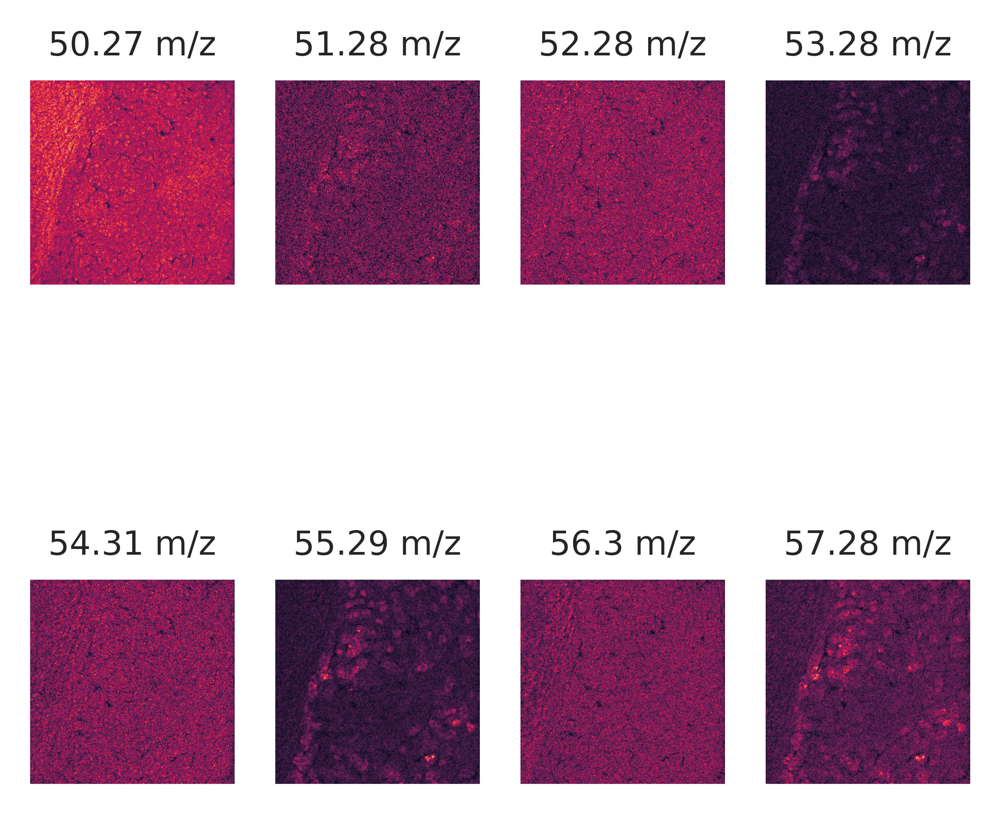

In [4]:
SEAM.pl.IMS(a,list(a.var_names[:8]),n_cols=4)

# View

In [5]:
a = SEAM.tl.View(a,method='Umap')

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/envs/scaden/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../anaconda3/envs/sc

In [4]:
SEAM.pl.View(a)

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 1935 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


In [8]:
a.write('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo.h5ad')

# Cut

In [6]:
a = ad.read_h5ad('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo.h5ad')


In [16]:
a=SEAM.tl.Cut(a)

setting obsm: spatial


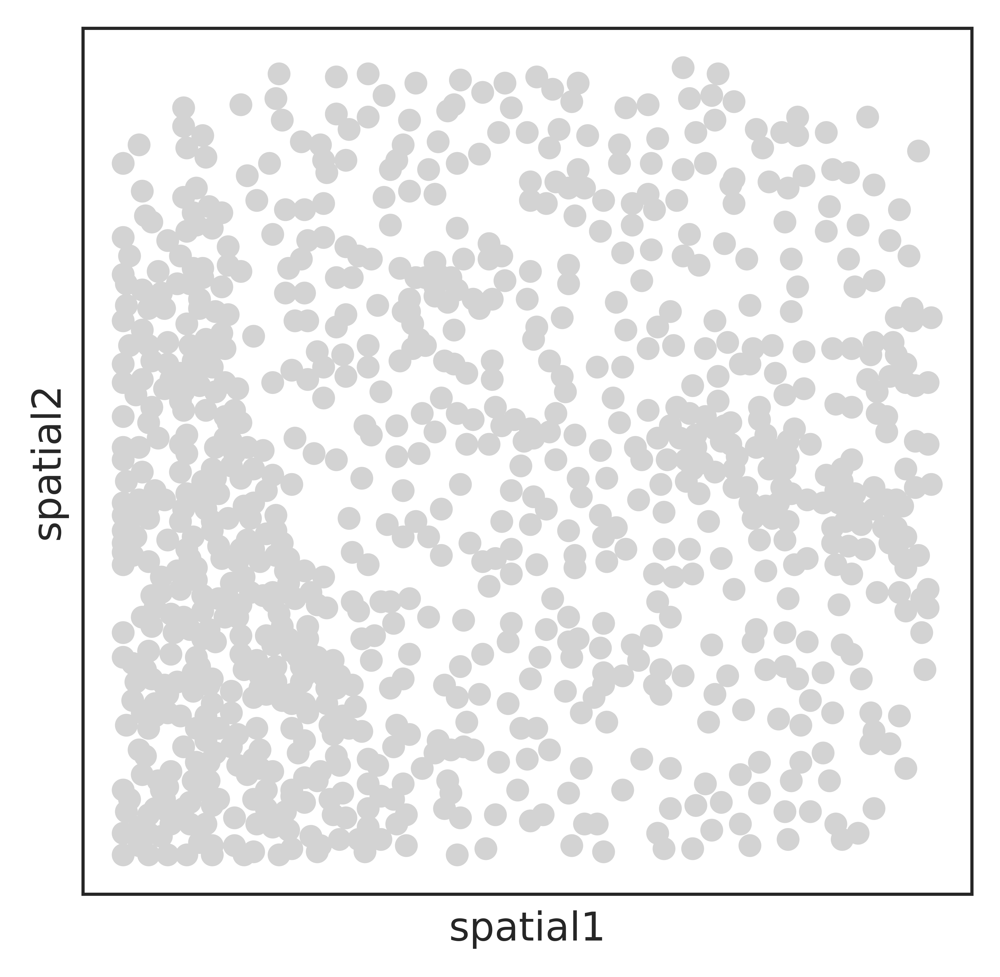

In [5]:
SEAM.pl.Cut(a,method='dot')

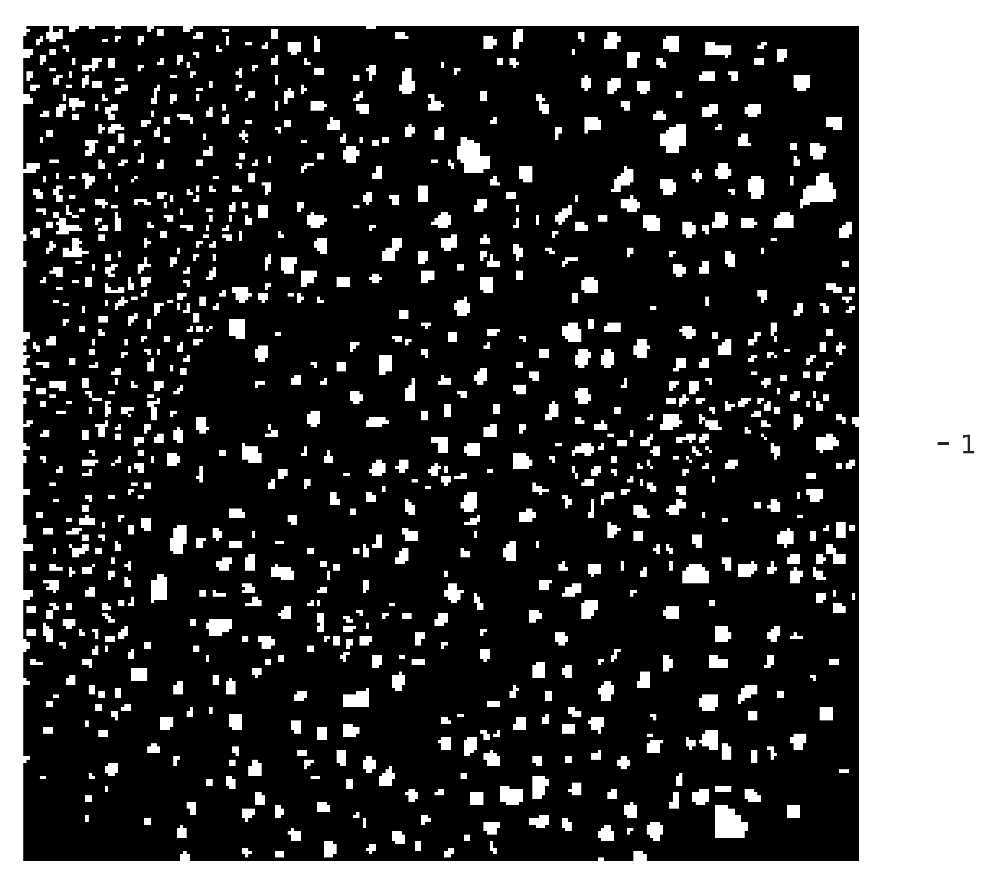

In [6]:
SEAM.pl.Cut(a,method='mask')

# ID

In [7]:
a = SEAM.tl.ID(a,epochs=50,t=5)

/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Epoch 1/50
7145/7145 [==============================] - 1s 205us/step - loss: 6.6815 - softmax_loss: 6.6817 - center_loss: 4.1633
Epoch 2/50
7145/7145 [==============================] - 2s 226us/step - loss: 6.3869 - softmax_loss: 6.3870 - center_loss: 6.9262
Epoch 3/50
7145/7145 [==============================] - 1s 154us/step - loss: 6.1321 - softmax_loss: 6.1325 - center_loss: 14.1166
Epoch 4/50
7145/7145 [==============================] - 1s 105us/step - loss: 5.9542 - softmax_loss: 5.9529 - center_loss: 27.6880
Epoch 5/50
7145/7145 [==============================] - 1s 101us/step - loss: 5.8452 - softmax_loss: 5.8447 - center_loss: 40.7919
Epoch 6/50
7145/7145 [==============================] - 1s 102us/step - loss: 5.7823 - softmax_loss: 5.7826 - center_loss: 51.8393
Epoch 7/50
7145/7145 [==============================] - 1s 100us/step - loss: 5.7407 - softmax_loss: 5.7410 - center_loss: 62.0890
Epoch 8/50
7145/7145 [==============================] - 1s 118us/step - loss: 5.7118 

In [8]:
a.write('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo_ID.h5ad')

In [3]:
a = ad.read_h5ad('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo_ID.h5ad')


In [4]:
a = SEAM.tl.Umap(a,rep='ID')

computing neighbors
    finished (0:00:01)
computing UMAP
    finished (0:00:02)
Sucessfully run Umap!


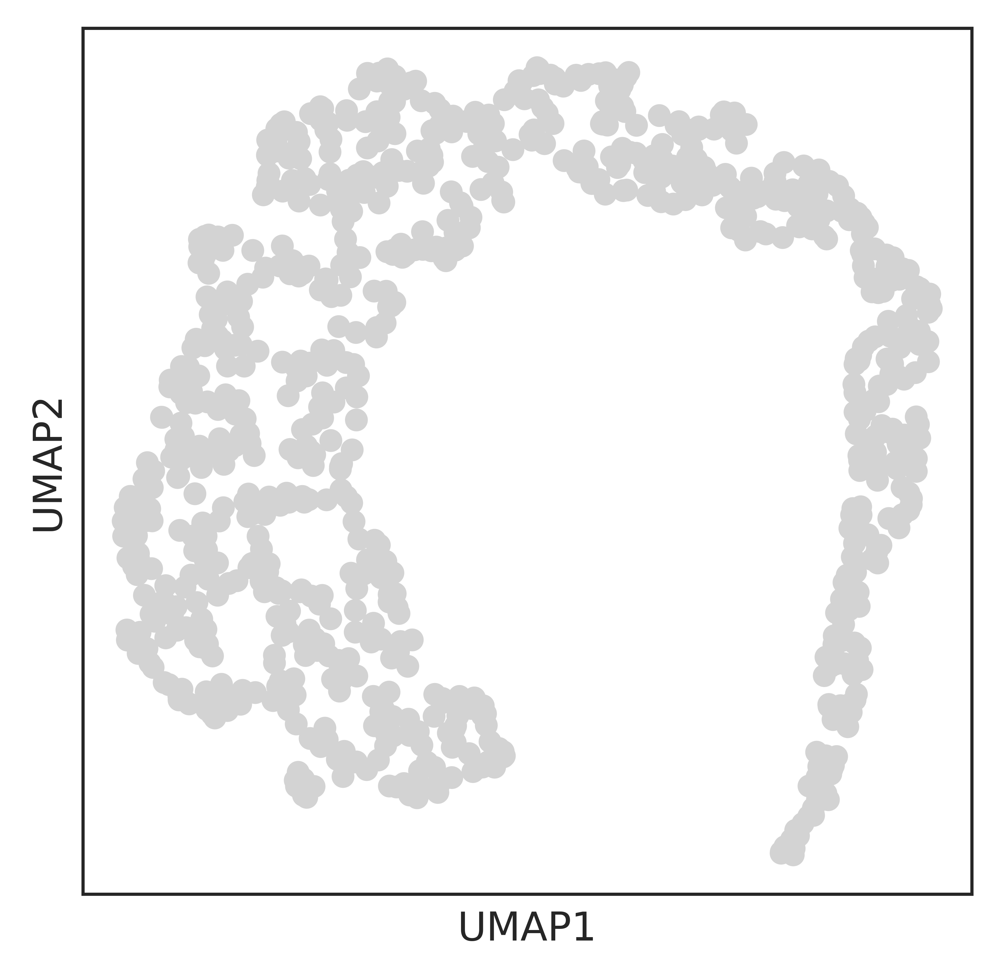

In [7]:
sc.pl.umap(a)

# Cluster

In [8]:
a.write('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo_Cluster.h5ad')

In [10]:
a=SEAM.tl.Cluster(a,'SIMLR',5)

(902, 7145) 5
SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:70: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/SIMLR/core.py:75: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 2.599070 seconds in total

done!


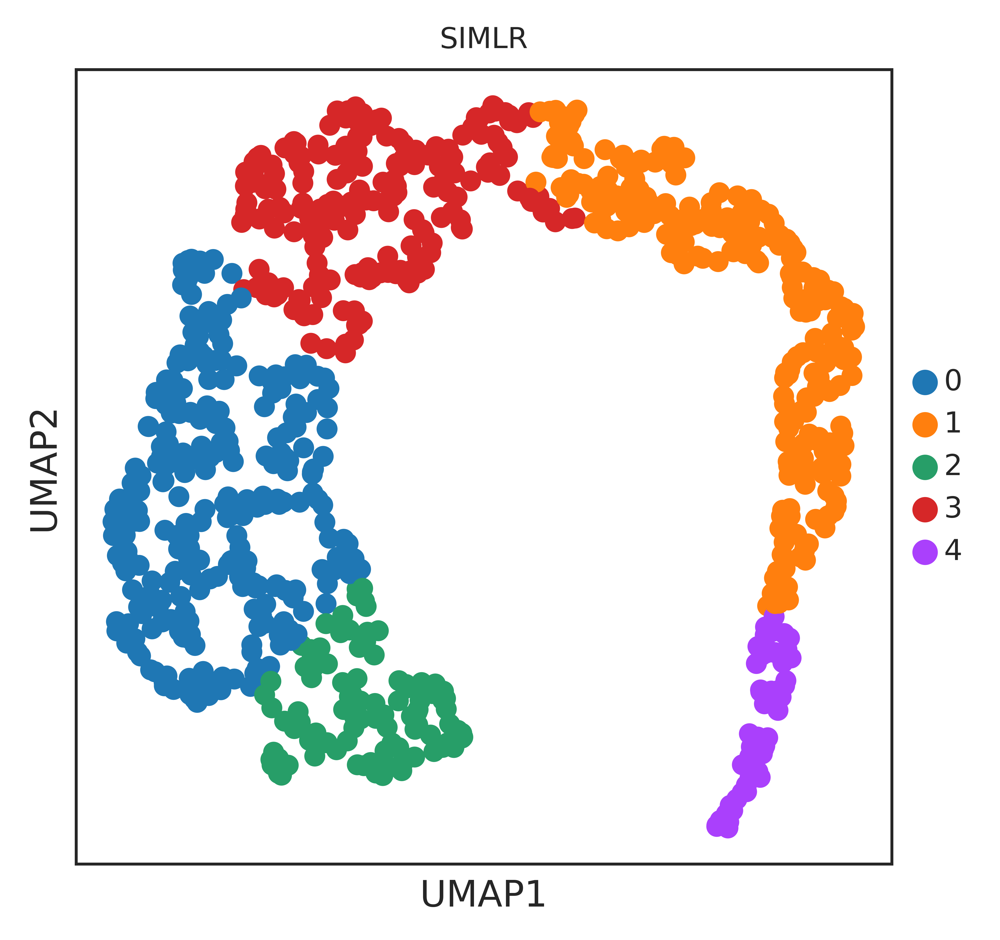

In [12]:
SEAM.pl.ID(a)

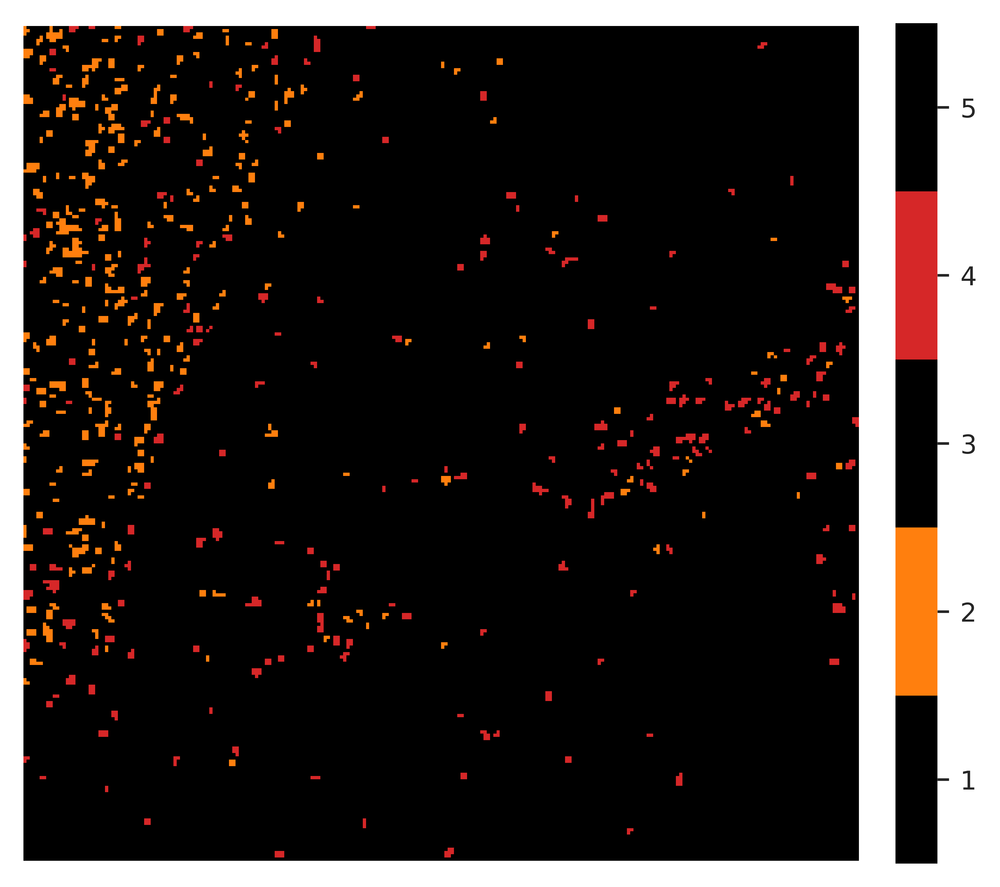

In [13]:
SEAM.pl.Cluster(a,'SIMLR',[1,3],'mask')

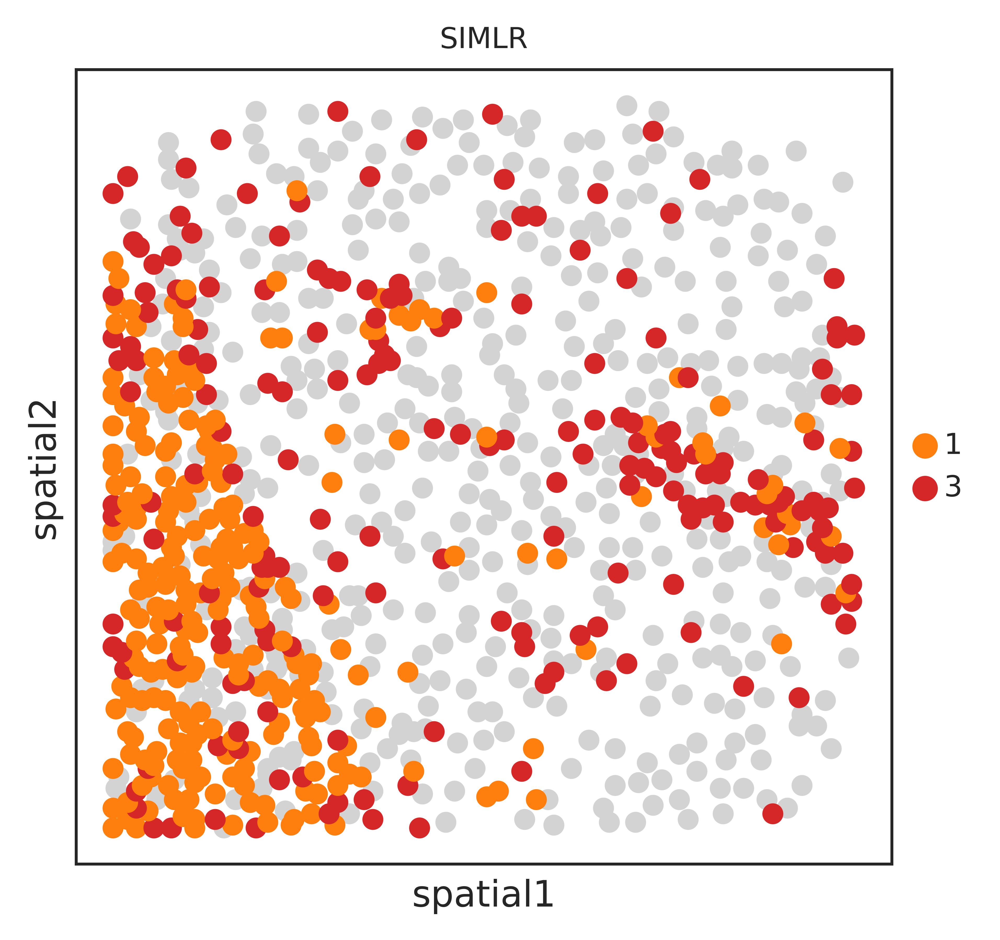

In [17]:
SEAM.pl.Cluster(a,'SIMLR',[1,3],'dot')

In [18]:
a.write('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo_Cluster.h5ad')

# Diff

In [3]:
a = ad.read_h5ad('/home/yzy/projects/SEAM/SEAM/data/dump/demo/demo_Cluster.h5ad')


In [4]:
a = SEAM.tl.get_m_sc(a,10,'SIMLR',method='score_topk')

ranking genes
    finished (0:00:00)
11
11
11
11
11


In [5]:
SEAM.pl.Diff(a,'SIMLR','SIMLR_mz',show_gene_labels=True)